# TP séance 7 - Arbres et plus courts chemins
L'objectif de ce TP est d'implémenter les algorithmes de Kruskal, Prim et Dijkstra vus en cours.
L'algorithme de Dijkstra sera utilisé pour un problème concret : calculer le meilleur itinéraire entre deux points d'une ville, et l'afficher sur une carte.

## Exercice 1 : algorithme de Kruskal


### Q.1
Utilisez les fonctions de NetworkX pour générer des graphes aléatoires *pondérés*, et afficher les poids des arêtes sur le graphe ; vous pourrez utiliser un graphe de type $G_{n,m}$, avec environ 1,5 fois plus d'arêtes que de sommets.

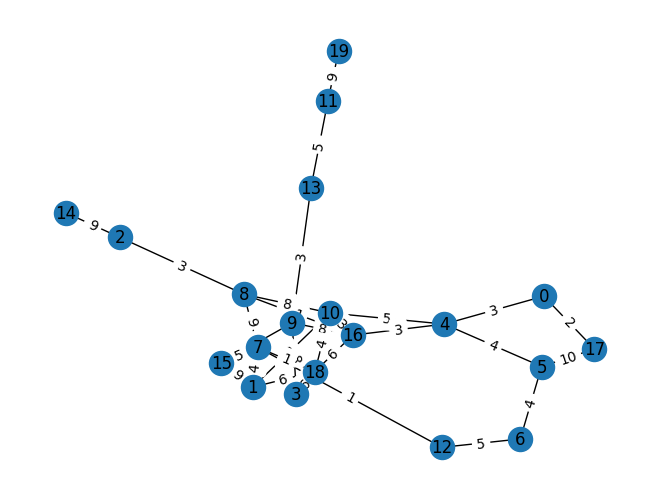

In [1]:
import networkx as nx
import random
import matplotlib.pyplot as plt

som = 20 
arr = int(som*1.5) 
G = nx.gnm_random_graph(som, arr)



for (u,v) in G.edges():
    G[u][v]['weight'] = random.randint(1,10)


pos = nx.spring_layout(G)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.show()



### Q.2 
Implémentez l'algorithme de Kruskal et testez-le sur un graphe pondéré aléatoire, d'abord en affichant la *liste* des arêtes de l'arbre couvrant de poids minimum, puis en mettant en évidence ces arêtes sur le graphe. Comment détecter / empêcher la formation d'un cycle ?

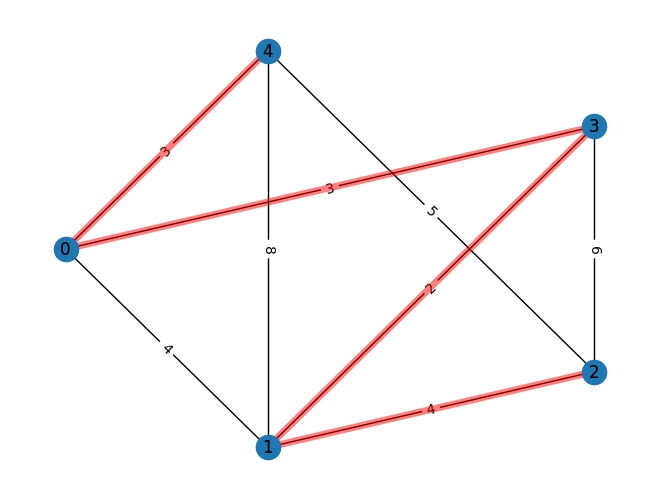

In [2]:
def kruskal_mst(graph):
    mst = nx.Graph()
    edges = sorted(graph.edges(data=True), key=lambda t: t[2].get('weight', 1))
    for i in range(len(edges)):
        mst.add_edge(edges[i][0],edges[i][1])
        try :
            nx.find_cycle(mst)
            mst.remove_edge(edges[i][0],edges[i][1])
        except :
            pass
    return mst


G = nx.gnm_random_graph(5, 8)
for (u,v) in G.edges():
    G[u][v]['weight'] = random.randint(1,8)
pos = nx.shell_layout(G)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
mst = kruskal_mst(G)

nx.draw(mst,pos, with_labels = True, width=5, alpha=0.5, edge_color='r')
plt.show()

## Exercice 2 : algorithme de Prim
Implémentez l'algorithme de Prim ; pensez à le tester également !

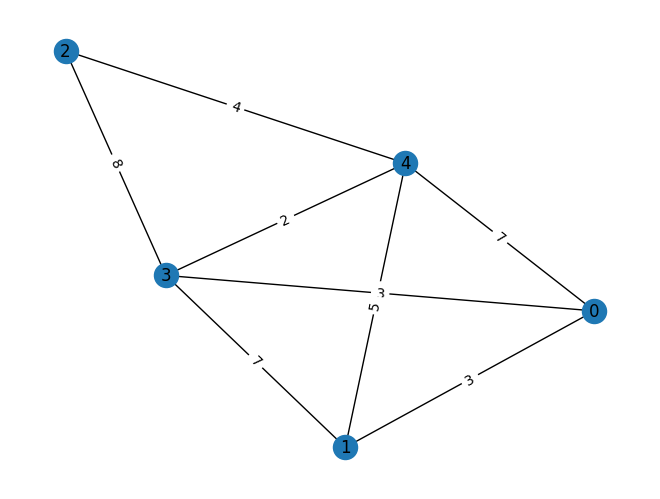

In [3]:
def prim(G):
    visited = []
    parents = {}
    sommet = {}
    val = float('inf')
    for node in G.nodes():
        sommet[node] = float('inf')
    while len(visited) < len(G.nodes()):
        if len(visited) == 0:
            node = random.choice(list(G.nodes()))
            visited.append(node)
            sommet[node] = 0
        else:
            min = float('inf')
            for node in visited:
                for neighbor in G.neighbors(node):
                    if neighbor not in visited:
                        if G[node][neighbor]['weight'] < min:
                            min = G[node][neighbor]['weight']
                            parents[neighbor] = node
                            sommet[neighbor] = min
            for node, poid in sommet.items():
                if poid < val:
                    val = poid
                    som = node  
            visited.append(som)
    return visited

G = nx.gnm_random_graph(5, 8)
for (u,v) in G.edges():
    G[u][v]['weight'] = random.randint(1,8)
pos = nx.spring_layout(G)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)


# print(prim(G))


plt.show()



## Exercice 3 : Algorithme de Dijkstra
Ecrivez une fonction `dijkstra(G, s, d)` qui prend un graphe pondéré en entrée, et calcule le plus court chemin du sommet source `s` vers le sommet destination `d`. Votre fonction doit retourner **la longueur de l'itinéraire (en m)** ainsi que **la liste des sommets permettant de reconstituer l'itinéraire**. Testez cette fonction sur un graphe aléatoire.

[0, 1, 2, 4]


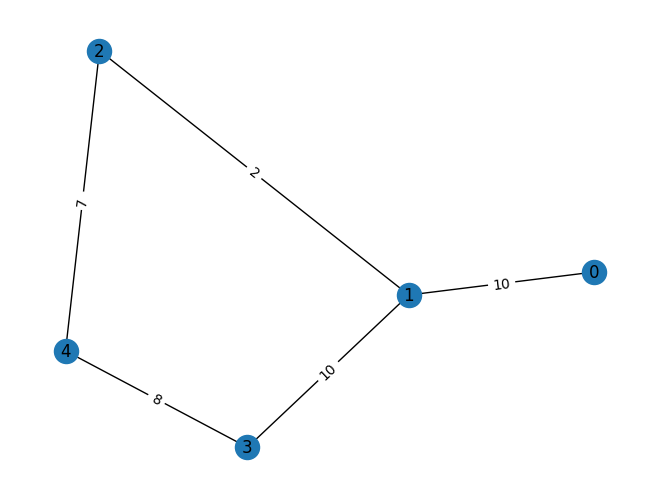

In [4]:
import heapq

# CHAT GPT A FAIT LA FONCTION ET RODOLPHE

def dijkstra(G, start, end):
    # Initialisation des distances à l'infini pour tous les sommets, sauf le départ à 0
    distances = {v: float('inf') for v in G.nodes()}
    distances[start] = 0

    # Initialisation de la liste de priorité avec le départ et sa distance
    heap = [(0, start)]

    # Initialisation du dictionnaire des prédécesseurs
    predecessors = {v: None for v in G.nodes()}

    # Boucle principale de l'algorithme de Dijkstra
    while heap:
        # Récupération du sommet avec la distance minimale dans la liste de priorité
        (current_distance, current_vertex) = heapq.heappop(heap)

        # Si on a atteint le sommet d'arrivée, on peut s'arrêter
        if current_vertex == end:
            break

        # Sinon, on examine les voisins du sommet actuel
        for neighbor in G.neighbors(current_vertex):
            # Calcul de la distance entre le sommet actuel et le voisin
            distance = current_distance + G.edges[current_vertex, neighbor]['weight']

            # Si la distance calculée est plus petite que celle enregistrée pour ce voisin, on la met à jour
            if distance < distances[neighbor]:
                distances[neighbor] = distance
                predecessors[neighbor] = current_vertex
                heapq.heappush(heap, (distance, neighbor))

    # Construction de la liste de sommets représentant le chemin le plus court
    path = []
    current_vertex = end
    while current_vertex is not None:
        path.insert(0, current_vertex)
        current_vertex = predecessors[current_vertex]

    # Si le chemin le plus court n'a pas été trouvé, on retourne une liste vide
    if distances[end] == float('inf'):
        return []

    # Sinon, on retourne la liste de sommets représentant le chemin le plus court
    return path

G = nx.gnm_random_graph(5, 5)
for (u,v) in G.edges():
    G[u][v]['weight'] = random.randint(1,10)
pos = nx.spring_layout(G)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

print(dijkstra(G, 0, 4))

## Exercice 4 : Application au calcul d'itinéraire
[OSMnx](https://geoffboeing.com/2016/11/osmnx-python-street-networks/) est un package Python permettant d'exploiter au format NetworkX les données disponibles sur [OpenStreetMap](https://openstreetmap.org). Il permet notamment de récupérer toutes les informations du réseau routier, piéton, de transports en commun, etc. et de le manipuler avec NetworkX. De nombreux exemples sont disponibles [sur cette page](https://github.com/gboeing/osmnx-examples).

Google Colaboratory permet d'exécuter des notebooks sur lesquels OSMnx et toutes ses dépendances sont installées.

**Note** : Vous pouvez aussi bien sûr travailler en local, mais il vous faudra installer OSMnx et toutes ses dépendances.

On commence par installer la librairie OSMnx :

*Edit 2023 : la version 1.24 de `numpy` pose problème dans Colab ; on force l'installation de la version 1.23*

In [5]:
%pip install numpy==1.23
%pip install osmnx

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


On importe ensuite les paquets nécessaires :

In [6]:
import networkx as nx
import osmnx as ox

%matplotlib inline
ox.config(log_console=True)

/Users/valentinb/Library/Python/3.9/lib/python/site-packages/osmnx/utils.py:192: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  warnings.warn(


*A partir de maintenant, toutes les informations, fonctions... sont à chercher dans les documentations fournies au début de cette section.*

**Affichez le réseau routier de Lyon :**

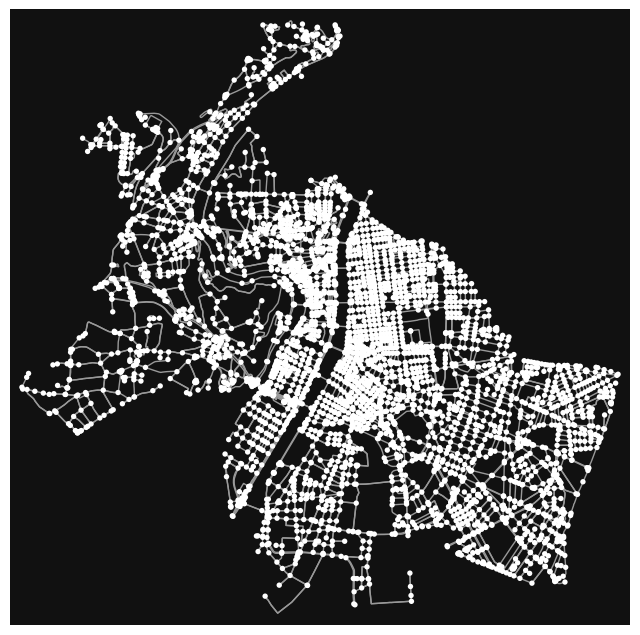

In [7]:
ox.plot_graph(ox.graph_from_place('Lyon, France', network_type='drive'))
plt.show()

Par défaut, les sommets sont affichés ; quand ils sont trop nombreux, ils nuisent à la lisibilité du graphe. **Affichez de nouveau le réseau routier, en jaune, dans une image de taille 10x10, et sans afficher les sommets.**

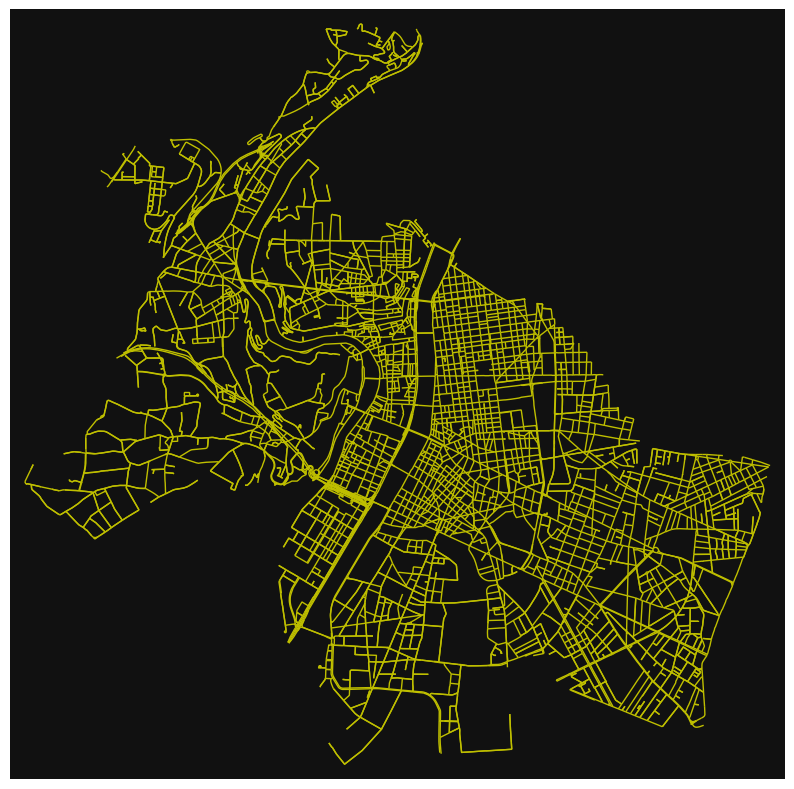

In [8]:
ox.plot_graph(ox.graph_from_place('Lyon, France', network_type='drive'), figsize=(10,10),node_size=0, edge_color='y')
plt.show()

**Combien de sommets et d'arêtes ce graphes comporte-t-il ?**



In [9]:
lyon = ox.graph_from_place('Lyon, France', network_type='drive')
print(lyon)

MultiDiGraph with 4249 nodes and 8477 edges


**Superposez le réseau routier sur une carte de Lyon** (il existe une fonction d'affichage d'OSMnx pour ça ;)) ; **faites-en sorte que le nom d'une rue soit affiché quand on clique dessus**.

In [10]:

import folium
lyon = ox.graph_from_place('Lyon, France', network_type='drive')

# J'ai enregistrer dans un fichier texte le graphe de lyon pour savoir comment était former la liste et doboguer la dernière partie
with open("lyon.txt", "w") as f:
    f.write(str(lyon.edges(data=True)))

location = ox.geocode('Lyon, France')
m = folium.Map(location=[location[0], location[1]], zoom_start=18, tiles='OpenStreetMap')

graph_map = ox.plot_graph_folium(lyon, graph_map=m, popup_attribute='name', linewidth = 2)
graph_map




A présent, l'idée est de déterminer le plus court chemin entre les deux points géographiques fournis, à l'aide de l'algorithme de Dijkstra codé ci-dessus, et de l'afficher sur la carte.

Les *numéros* des sommets donnés par OpenStreetMap sont ceux de sa base de données *mondiale* : il peuvent être très grands (de l'ordre du milliard pour certains) et surtout ne pas être consécutifs. **Si besoin, modifiez votre fonction `dijkstra` pour qu'elle puisse gérer des numéros de sommets quelconques.**

La fonction `nearest_nodes` renvoie le sommet / noeud du graphe le plus proche des coordonnées géographiques (longitude, latitude) données en paramètre. Récupérez les coordonnées des deux points géographiques fournis (via Google Maps, ou [OpenStreetMap](https://www.openstreetmap.org) en faisant un clic-droit puis *Affichez l'adresse*) et affichez les numéros des sommets les plus proches.

In [11]:
#coordonnées charpennes : 45.7742, 4.8597

nearest_node = ox.nearest_nodes(lyon,  4.818029,45.734447)
nearest_node2 = ox.nearest_nodes(lyon, 4.826524838333892, 45.75289279125011)
print(nearest_node)
print(nearest_node2)

16564365
23666905


Appliquez votre fonction `dijkstra` aux deux sommets du graphe, puis superposez en rouge l'itinéraire obtenu :

In [12]:
# MEME FONCTIONS LEGEREMENT MODIFIEE DONC PROVIENT PRINCIAPLEMENT DE CHATGPT
def dijkstra2(G, start, end):
    # Initialisation des distances à l'infini pour tous les sommets, sauf le départ à 0
    distances = {v: float('inf') for v in G.nodes()}
    distances[start] = 0

    # Initialisation de la liste de priorité avec le départ et sa distance
    heap = [(0, start)]

    # Initialisation du dictionnaire des prédécesseurs
    predecessors = {v: None for v in G.nodes()}

    # Boucle principale de l'algorithme de Dijkstra
    while heap:
        # Récupération du sommet avec la distance minimale dans la liste de priorité
        (current_distance, current_vertex) = heapq.heappop(heap)

        # Si on a atteint le sommet d'arrivée, on peut s'arrêter
        if current_vertex == end:
            break

        # Sinon, on examine les voisins du sommet actuel
        for neighbor in G.neighbors(current_vertex):
            # Calcul de la distance entre le sommet actuel et le voisin
            distance = current_distance + G.edges[current_vertex, neighbor,0]['length'] # modification du 0 pour prendre en compte le poids

            # Si la distance calculée est plus petite que celle enregistrée pour ce voisin, on la met à jour
            if distance < distances[neighbor]:
                distances[neighbor] = distance
                predecessors[neighbor] = current_vertex
                heapq.heappush(heap, (distance, neighbor))

    # Construction de la liste de sommets représentant le chemin le plus court
    path = []
    current_vertex = end
    while current_vertex is not None:
        path.insert(0, current_vertex)
        current_vertex = predecessors[current_vertex]

    # Si le chemin le plus court n'a pas été trouvé, on retourne une liste vide
    if distances[end] == float('inf'):
        return []

    # Sinon, on retourne la liste de sommets représentant le chemin le plus court
    return path


trajet = dijkstra2(lyon, nearest_node, nearest_node2)

location = ox.geocode('Lyon, France')
m = folium.Map(location=[location[0], location[1]], zoom_start=18, tiles='OpenStreetMap')

graph_map = ox.plot_graph_folium(lyon, graph_map=m, popup_attribute='name')

# Pour avoir une liste de tuple pour les arrêtes 
# path = []
# for i in range(len(trajet)-1):
#     path.append((trajet[i],trajet[i+1]))

ox.plot_route_folium(lyon, trajet, color='red', tiles="OpenStreetMap")
